# Implementation and Training of VideoColorizer UNet model

With or without optical flow as specified


Inputs:
- previous frame: L, ab channels
- (optional) optical flow: 2 channels (x,y - np.array)
- current frame: L channel

Outputs:
- current frame: ab channels

TBD:
- split into train and test/val sets

## 1. Data Loading

using the pytorch dataloader and dataset implementation from DataLoad.py

In [1]:
from dataloader import CustomImageDataset, FrameGapImageDataset
from train import train
from prediction import plot_n_predictions
from utility import plot_loss
import os

In [2]:
# HYPERPARAMETERS
dataset_path = '~/Documents/Colorization/Datasets/DAVIS'
dataset_path = os.path.expanduser(dataset_path)
model_path = '~/Documents/Colorization/Models'
model_path = os.path.expanduser(model_path)
subdir_train = 'train'
subdir_val = 'val'
subdir_test = 'test'
res = '176p'

architecture = 'BigAutoencoder'
method = 'deepflow'

epochs = 150
lr = 5e-5
gamma = 1
batch_size = 16
num = 10

save_model = True
use_flow = False

In [3]:
train_data = CustomImageDataset(dataset_path, subdir_train, res, method, use_flow)
val_data = CustomImageDataset(dataset_path, subdir_val, res, method, use_flow)
test_data = CustomImageDataset(dataset_path, subdir_test, res, method, use_flow)

train_dataset_size = len(train_data)
val_dataset_size = len(val_data)
test_dataset_size = len(test_data)

print(f'\nTrain Dataset size: {train_dataset_size}')
print(f'Validation Dataset size: {val_dataset_size}')
print(f'Test Dataset size: {test_dataset_size}')

vid labels: ['bear', 'bike-packing', 'blackswan', 'bmx-bumps', 'bmx-trees', 'boat', 'boxing-fisheye', 'breakdance', 'breakdance-flare', 'bus', 'camel', 'car-roundabout', 'car-shadow', 'car-turn', 'cat-girl', 'classic-car', 'color-run', 'cows', 'crossing', 'dance-jump', 'dance-twirl', 'dancing', 'disc-jockey', 'dog', 'dog-agility', 'dog-gooses', 'dogs-jump', 'dogs-scale', 'drift-chicane', 'drift-straight', 'drift-turn', 'drone', 'elephant', 'flamingo', 'goat', 'gold-fish', 'hike', 'hockey', 'horsejump-high', 'horsejump-low', 'india', 'judo', 'kid-football', 'kite-surf', 'kite-walk', 'koala', 'lab-coat', 'lady-running', 'libby', 'lindy-hop', 'loading', 'longboard', 'lucia', 'mallard-fly', 'mallard-water', 'mbike-trick', 'miami-surf', 'motocross-bumps', 'motocross-jump', 'motorbike', 'night-race', 'paragliding', 'paragliding-launch', 'parkour', 'pigs', 'planes-water', 'rallye', 'rhino', 'rollerblade', 'schoolgirls', 'scooter-black', 'scooter-board', 'scooter-gray', 'sheep', 'shooting', 's

In [4]:
train_loss, val_loss = train(train_data, val_data, architecture, method, use_flow, lr, batch_size, gamma, save_model, epochs, model_path, resume_training=False)
# plot_loss(architecture, train_loss, val_loss)
# plot_n_predictions(test_data, model_path, architecture, method, epochs, use_flow, batch_size, num)

Cuda available: True
Using device: cuda

Checkpoint path: /home/jansp/Documents/Colorization/Models/BigAutoencoder/BigAutoencoder_deepflow_150_epochs

Epoch 1
-------------------------------


383it [00:40,  9.48it/s]



Train set: Average loss: 0.0142312
Validation set: Average loss: 0.0013479

Epoch 2
-------------------------------


383it [00:35, 10.65it/s]



Train set: Average loss: 0.0004456
Validation set: Average loss: 0.0002902

Epoch 3
-------------------------------


383it [00:35, 10.68it/s]



Train set: Average loss: 0.0002118
Validation set: Average loss: 0.0002018

Epoch 4
-------------------------------


383it [00:35, 10.81it/s]



Train set: Average loss: 0.0001575
Validation set: Average loss: 0.0001561

Epoch 5
-------------------------------


383it [00:36, 10.64it/s]



Train set: Average loss: 0.0001254
Validation set: Average loss: 0.0001250

Epoch 6
-------------------------------


383it [00:36, 10.54it/s]



Train set: Average loss: 0.0001024
Validation set: Average loss: 0.0001059

Epoch 7
-------------------------------


383it [00:35, 10.74it/s]



Train set: Average loss: 0.0000866
Validation set: Average loss: 0.0000863

Epoch 8
-------------------------------


383it [00:36, 10.61it/s]



Train set: Average loss: 0.0000748
Validation set: Average loss: 0.0000753

Epoch 9
-------------------------------


383it [00:36, 10.46it/s]



Train set: Average loss: 0.0000674
Validation set: Average loss: 0.0000659

Epoch 10
-------------------------------


383it [00:36, 10.52it/s]



Train set: Average loss: 0.0000611
Validation set: Average loss: 0.0000618

Epoch 11
-------------------------------


383it [00:36, 10.58it/s]



Train set: Average loss: 0.0000559
Validation set: Average loss: 0.0000559

Epoch 12
-------------------------------


383it [00:35, 10.81it/s]



Train set: Average loss: 0.0000527
Validation set: Average loss: 0.0000529

Epoch 13
-------------------------------


383it [00:35, 10.67it/s]



Train set: Average loss: 0.0000486
Validation set: Average loss: 0.0000494

Epoch 14
-------------------------------


383it [00:36, 10.41it/s]



Train set: Average loss: 0.0000462
Validation set: Average loss: 0.0000476

Epoch 15
-------------------------------


383it [00:41,  9.32it/s]



Train set: Average loss: 0.0000434
Validation set: Average loss: 0.0000455

Epoch 16
-------------------------------


383it [00:37, 10.34it/s]



Train set: Average loss: 0.0000420
Validation set: Average loss: 0.0000472

Epoch 17
-------------------------------


383it [00:37, 10.19it/s]



Train set: Average loss: 0.0000396
Validation set: Average loss: 0.0000427

Epoch 18
-------------------------------


383it [00:34, 11.10it/s]



Train set: Average loss: 0.0000374
Validation set: Average loss: 0.0000429

Epoch 19
-------------------------------


383it [00:35, 10.71it/s]



Train set: Average loss: 0.0000362
Validation set: Average loss: 0.0000406

Epoch 20
-------------------------------


383it [00:37, 10.18it/s]



Train set: Average loss: 0.0000341
Validation set: Average loss: 0.0000399

Epoch 21
-------------------------------


383it [00:37, 10.34it/s]



Train set: Average loss: 0.0000329
Validation set: Average loss: 0.0000409

Epoch 22
-------------------------------


383it [00:35, 10.71it/s]



Train set: Average loss: 0.0000319
Validation set: Average loss: 0.0000374

Epoch 23
-------------------------------


383it [00:36, 10.57it/s]



Train set: Average loss: 0.0000309
Validation set: Average loss: 0.0000368

Epoch 24
-------------------------------


383it [00:35, 10.74it/s]



Train set: Average loss: 0.0000298
Validation set: Average loss: 0.0000364

Epoch 25
-------------------------------


383it [00:36, 10.50it/s]



Train set: Average loss: 0.0000290
Validation set: Average loss: 0.0000366

Epoch 26
-------------------------------


383it [00:36, 10.60it/s]



Train set: Average loss: 0.0000284
Validation set: Average loss: 0.0000355

Epoch 27
-------------------------------


383it [00:36, 10.59it/s]



Train set: Average loss: 0.0000276
Validation set: Average loss: 0.0000349

Epoch 28
-------------------------------


383it [00:35, 10.76it/s]



Train set: Average loss: 0.0000270
Validation set: Average loss: 0.0000347

Epoch 29
-------------------------------


383it [00:37, 10.24it/s]



Train set: Average loss: 0.0000260
Validation set: Average loss: 0.0000346

Epoch 30
-------------------------------


383it [00:36, 10.62it/s]



Train set: Average loss: 0.0000257
Validation set: Average loss: 0.0000338

Epoch 31
-------------------------------


383it [00:38, 10.06it/s]



Train set: Average loss: 0.0000253
Validation set: Average loss: 0.0000336

Epoch 32
-------------------------------


383it [00:36, 10.37it/s]



Train set: Average loss: 0.0000247
Validation set: Average loss: 0.0000341

Epoch 33
-------------------------------


383it [00:35, 10.78it/s]



Train set: Average loss: 0.0000243
Validation set: Average loss: 0.0000335

Epoch 34
-------------------------------


383it [00:36, 10.43it/s]



Train set: Average loss: 0.0000239
Validation set: Average loss: 0.0000326

Epoch 35
-------------------------------


383it [00:36, 10.60it/s]



Train set: Average loss: 0.0000235
Validation set: Average loss: 0.0000327

Epoch 36
-------------------------------


383it [00:36, 10.59it/s]



Train set: Average loss: 0.0000231
Validation set: Average loss: 0.0000322

Epoch 37
-------------------------------


383it [00:35, 10.69it/s]



Train set: Average loss: 0.0000229
Validation set: Average loss: 0.0000320

Epoch 38
-------------------------------


383it [00:35, 10.68it/s]



Train set: Average loss: 0.0000224
Validation set: Average loss: 0.0000317

Epoch 39
-------------------------------


383it [00:36, 10.61it/s]



Train set: Average loss: 0.0000220
Validation set: Average loss: 0.0000317

Epoch 40
-------------------------------


383it [00:36, 10.36it/s]



Train set: Average loss: 0.0000219
Validation set: Average loss: 0.0000320

Epoch 41
-------------------------------


383it [00:37, 10.30it/s]



Train set: Average loss: 0.0000217
Validation set: Average loss: 0.0000315

Epoch 42
-------------------------------


383it [00:36, 10.41it/s]



Train set: Average loss: 0.0000212
Validation set: Average loss: 0.0000323

Epoch 43
-------------------------------


383it [00:37, 10.27it/s]



Train set: Average loss: 0.0000210
Validation set: Average loss: 0.0000329

Epoch 44
-------------------------------


383it [00:36, 10.52it/s]



Train set: Average loss: 0.0000208
Validation set: Average loss: 0.0000311

Epoch 45
-------------------------------


383it [00:36, 10.41it/s]



Train set: Average loss: 0.0000205
Validation set: Average loss: 0.0000310

Epoch 46
-------------------------------


383it [00:36, 10.48it/s]



Train set: Average loss: 0.0000202
Validation set: Average loss: 0.0000313

Epoch 47
-------------------------------


383it [00:36, 10.56it/s]



Train set: Average loss: 0.0000201
Validation set: Average loss: 0.0000306

Epoch 48
-------------------------------


383it [00:36, 10.58it/s]



Train set: Average loss: 0.0000200
Validation set: Average loss: 0.0000310

Epoch 49
-------------------------------


383it [00:37, 10.23it/s]



Train set: Average loss: 0.0000197
Validation set: Average loss: 0.0000315

Epoch 50
-------------------------------


383it [00:36, 10.49it/s]



Train set: Average loss: 0.0000194
Validation set: Average loss: 0.0000307

Epoch 51
-------------------------------


383it [00:36, 10.57it/s]



Train set: Average loss: 0.0000194
Validation set: Average loss: 0.0000304

Epoch 52
-------------------------------


383it [00:35, 10.88it/s]



Train set: Average loss: 0.0000190
Validation set: Average loss: 0.0000321

Epoch 53
-------------------------------


383it [00:34, 11.07it/s]



Train set: Average loss: 0.0000189
Validation set: Average loss: 0.0000309

Epoch 54
-------------------------------


383it [00:35, 10.90it/s]



Train set: Average loss: 0.0000189
Validation set: Average loss: 0.0000313

Epoch 55
-------------------------------


383it [00:35, 10.83it/s]



Train set: Average loss: 0.0000185
Validation set: Average loss: 0.0000302

Epoch 56
-------------------------------


383it [00:36, 10.52it/s]



Train set: Average loss: 0.0000183
Validation set: Average loss: 0.0000315

Epoch 57
-------------------------------


383it [00:35, 10.81it/s]



Train set: Average loss: 0.0000182
Validation set: Average loss: 0.0000296

Epoch 58
-------------------------------


383it [00:35, 10.85it/s]



Train set: Average loss: 0.0000181
Validation set: Average loss: 0.0000302

Epoch 59
-------------------------------


383it [00:34, 11.03it/s]



Train set: Average loss: 0.0000180
Validation set: Average loss: 0.0000303

Epoch 60
-------------------------------


383it [00:34, 11.05it/s]



Train set: Average loss: 0.0000179
Validation set: Average loss: 0.0000306

Epoch 61
-------------------------------


383it [00:35, 10.93it/s]



Train set: Average loss: 0.0000176
Validation set: Average loss: 0.0000296

Epoch 62
-------------------------------


383it [00:34, 11.09it/s]



Train set: Average loss: 0.0000176
Validation set: Average loss: 0.0000295

Epoch 63
-------------------------------


383it [00:35, 10.91it/s]



Train set: Average loss: 0.0000174
Validation set: Average loss: 0.0000295

Epoch 64
-------------------------------


383it [00:34, 11.10it/s]



Train set: Average loss: 0.0000174
Validation set: Average loss: 0.0000290

Epoch 65
-------------------------------


383it [00:34, 11.22it/s]



Train set: Average loss: 0.0000172
Validation set: Average loss: 0.0000302

Epoch 66
-------------------------------


383it [00:35, 10.92it/s]



Train set: Average loss: 0.0000171
Validation set: Average loss: 0.0000293

Epoch 67
-------------------------------


383it [00:34, 11.06it/s]



Train set: Average loss: 0.0000169
Validation set: Average loss: 0.0000303

Epoch 68
-------------------------------


383it [00:34, 11.21it/s]



Train set: Average loss: 0.0000169
Validation set: Average loss: 0.0000306

Epoch 69
-------------------------------


383it [00:34, 11.10it/s]



Train set: Average loss: 0.0000168
Validation set: Average loss: 0.0000292

Epoch 70
-------------------------------


383it [00:34, 11.13it/s]



Train set: Average loss: 0.0000167
Validation set: Average loss: 0.0000291

Epoch 71
-------------------------------


383it [00:34, 11.16it/s]



Train set: Average loss: 0.0000165
Validation set: Average loss: 0.0000292

Epoch 72
-------------------------------


383it [00:34, 11.11it/s]



Train set: Average loss: 0.0000165
Validation set: Average loss: 0.0000294

Epoch 73
-------------------------------


383it [00:34, 11.01it/s]



Train set: Average loss: 0.0000164
Validation set: Average loss: 0.0000296

Epoch 74
-------------------------------


383it [00:34, 11.00it/s]



Train set: Average loss: 0.0000163
Validation set: Average loss: 0.0000294

Epoch 75
-------------------------------


383it [00:34, 11.09it/s]



Train set: Average loss: 0.0000163
Validation set: Average loss: 0.0000288

Epoch 76
-------------------------------


383it [00:34, 11.07it/s]



Train set: Average loss: 0.0000161
Validation set: Average loss: 0.0000286

Epoch 77
-------------------------------


383it [00:34, 11.03it/s]



Train set: Average loss: 0.0000161
Validation set: Average loss: 0.0000291

Epoch 78
-------------------------------


383it [00:33, 11.60it/s]



Train set: Average loss: 0.0000160
Validation set: Average loss: 0.0000293

Epoch 79
-------------------------------


383it [00:28, 13.34it/s]



Train set: Average loss: 0.0000158
Validation set: Average loss: 0.0000292

Epoch 80
-------------------------------


383it [00:28, 13.37it/s]



Train set: Average loss: 0.0000158
Validation set: Average loss: 0.0000296

Epoch 81
-------------------------------


383it [00:28, 13.40it/s]



Train set: Average loss: 0.0000157
Validation set: Average loss: 0.0000290

Epoch 82
-------------------------------


383it [00:28, 13.44it/s]



Train set: Average loss: 0.0000156
Validation set: Average loss: 0.0000289

Epoch 83
-------------------------------


383it [00:28, 13.48it/s]



Train set: Average loss: 0.0000155
Validation set: Average loss: 0.0000287

Epoch 84
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000155
Validation set: Average loss: 0.0000292

Epoch 85
-------------------------------


383it [00:28, 13.40it/s]



Train set: Average loss: 0.0000154
Validation set: Average loss: 0.0000289

Epoch 86
-------------------------------


383it [00:28, 13.56it/s]



Train set: Average loss: 0.0000154
Validation set: Average loss: 0.0000282

Epoch 87
-------------------------------


383it [00:28, 13.47it/s]



Train set: Average loss: 0.0000153
Validation set: Average loss: 0.0000289

Epoch 88
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000151
Validation set: Average loss: 0.0000294

Epoch 89
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000150
Validation set: Average loss: 0.0000286

Epoch 90
-------------------------------


383it [00:28, 13.47it/s]



Train set: Average loss: 0.0000150
Validation set: Average loss: 0.0000293

Epoch 91
-------------------------------


383it [00:28, 13.54it/s]



Train set: Average loss: 0.0000149
Validation set: Average loss: 0.0000289

Epoch 92
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000149
Validation set: Average loss: 0.0000285

Epoch 93
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000148
Validation set: Average loss: 0.0000281

Epoch 94
-------------------------------


383it [00:28, 13.56it/s]



Train set: Average loss: 0.0000148
Validation set: Average loss: 0.0000292

Epoch 95
-------------------------------


383it [00:28, 13.47it/s]



Train set: Average loss: 0.0000147
Validation set: Average loss: 0.0000283

Epoch 96
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000146
Validation set: Average loss: 0.0000287

Epoch 97
-------------------------------


383it [00:28, 13.40it/s]



Train set: Average loss: 0.0000145
Validation set: Average loss: 0.0000285

Epoch 98
-------------------------------


383it [00:28, 13.47it/s]



Train set: Average loss: 0.0000146
Validation set: Average loss: 0.0000286

Epoch 99
-------------------------------


383it [00:28, 13.51it/s]



Train set: Average loss: 0.0000144
Validation set: Average loss: 0.0000290

Epoch 100
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000143
Validation set: Average loss: 0.0000284

Epoch 101
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000143
Validation set: Average loss: 0.0000289

Epoch 102
-------------------------------


383it [00:28, 13.48it/s]



Train set: Average loss: 0.0000143
Validation set: Average loss: 0.0000285

Epoch 103
-------------------------------


383it [00:28, 13.55it/s]



Train set: Average loss: 0.0000143
Validation set: Average loss: 0.0000288

Epoch 104
-------------------------------


383it [00:28, 13.57it/s]



Train set: Average loss: 0.0000141
Validation set: Average loss: 0.0000287

Epoch 105
-------------------------------


383it [00:28, 13.60it/s]



Train set: Average loss: 0.0000140
Validation set: Average loss: 0.0000294

Epoch 106
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000140
Validation set: Average loss: 0.0000286

Epoch 107
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000139
Validation set: Average loss: 0.0000283

Epoch 108
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000138
Validation set: Average loss: 0.0000287

Epoch 109
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000137
Validation set: Average loss: 0.0000293

Epoch 110
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000136
Validation set: Average loss: 0.0000282

Epoch 111
-------------------------------


383it [00:28, 13.55it/s]



Train set: Average loss: 0.0000135
Validation set: Average loss: 0.0000280

Epoch 112
-------------------------------


383it [00:28, 13.54it/s]



Train set: Average loss: 0.0000134
Validation set: Average loss: 0.0000284

Epoch 113
-------------------------------


383it [00:28, 13.47it/s]



Train set: Average loss: 0.0000133
Validation set: Average loss: 0.0000287

Epoch 114
-------------------------------


383it [00:28, 13.55it/s]



Train set: Average loss: 0.0000133
Validation set: Average loss: 0.0000282

Epoch 115
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000131
Validation set: Average loss: 0.0000284

Epoch 116
-------------------------------


383it [00:28, 13.56it/s]



Train set: Average loss: 0.0000132
Validation set: Average loss: 0.0000287

Epoch 117
-------------------------------


383it [00:28, 13.56it/s]



Train set: Average loss: 0.0000130
Validation set: Average loss: 0.0000282

Epoch 118
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000129
Validation set: Average loss: 0.0000286

Epoch 119
-------------------------------


383it [00:28, 13.50it/s]



Train set: Average loss: 0.0000128
Validation set: Average loss: 0.0000288

Epoch 120
-------------------------------


383it [00:28, 13.56it/s]



Train set: Average loss: 0.0000128
Validation set: Average loss: 0.0000277

Epoch 121
-------------------------------


383it [00:28, 13.47it/s]



Train set: Average loss: 0.0000128
Validation set: Average loss: 0.0000283

Epoch 122
-------------------------------


383it [00:28, 13.54it/s]



Train set: Average loss: 0.0000127
Validation set: Average loss: 0.0000281

Epoch 123
-------------------------------


383it [00:28, 13.54it/s]



Train set: Average loss: 0.0000126
Validation set: Average loss: 0.0000280

Epoch 124
-------------------------------


383it [00:28, 13.49it/s]



Train set: Average loss: 0.0000126
Validation set: Average loss: 0.0000285

Epoch 125
-------------------------------


383it [00:28, 13.60it/s]



Train set: Average loss: 0.0000125
Validation set: Average loss: 0.0000289

Epoch 126
-------------------------------


383it [00:28, 13.54it/s]



Train set: Average loss: 0.0000125
Validation set: Average loss: 0.0000284

Epoch 127
-------------------------------


383it [00:28, 13.58it/s]



Train set: Average loss: 0.0000124
Validation set: Average loss: 0.0000284

Epoch 128
-------------------------------


383it [00:28, 13.58it/s]



Train set: Average loss: 0.0000123
Validation set: Average loss: 0.0000283

Epoch 129
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000123
Validation set: Average loss: 0.0000282

Epoch 130
-------------------------------


383it [00:28, 13.51it/s]



Train set: Average loss: 0.0000122
Validation set: Average loss: 0.0000280

Epoch 131
-------------------------------


383it [00:28, 13.54it/s]



Train set: Average loss: 0.0000122
Validation set: Average loss: 0.0000286

Epoch 132
-------------------------------


383it [00:28, 13.61it/s]



Train set: Average loss: 0.0000122
Validation set: Average loss: 0.0000276

Epoch 133
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000121
Validation set: Average loss: 0.0000286

Epoch 134
-------------------------------


383it [00:28, 13.55it/s]



Train set: Average loss: 0.0000121
Validation set: Average loss: 0.0000286

Epoch 135
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000120
Validation set: Average loss: 0.0000276

Epoch 136
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000120
Validation set: Average loss: 0.0000281

Epoch 137
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000119
Validation set: Average loss: 0.0000277

Epoch 138
-------------------------------


383it [00:28, 13.61it/s]



Train set: Average loss: 0.0000119
Validation set: Average loss: 0.0000284

Epoch 139
-------------------------------


383it [00:28, 13.53it/s]



Train set: Average loss: 0.0000119
Validation set: Average loss: 0.0000281

Epoch 140
-------------------------------


383it [00:28, 13.38it/s]



Train set: Average loss: 0.0000118
Validation set: Average loss: 0.0000290

Epoch 141
-------------------------------


383it [00:29, 13.17it/s]



Train set: Average loss: 0.0000118
Validation set: Average loss: 0.0000286

Epoch 142
-------------------------------


383it [00:29, 13.06it/s]



Train set: Average loss: 0.0000118
Validation set: Average loss: 0.0000278

Epoch 143
-------------------------------


383it [00:29, 13.10it/s]



Train set: Average loss: 0.0000117
Validation set: Average loss: 0.0000279

Epoch 144
-------------------------------


383it [00:29, 13.09it/s]



Train set: Average loss: 0.0000117
Validation set: Average loss: 0.0000283

Epoch 145
-------------------------------


383it [00:29, 13.10it/s]



Train set: Average loss: 0.0000116
Validation set: Average loss: 0.0000279

Epoch 146
-------------------------------


383it [00:28, 13.42it/s]



Train set: Average loss: 0.0000116
Validation set: Average loss: 0.0000297

Epoch 147
-------------------------------


383it [00:28, 13.58it/s]



Train set: Average loss: 0.0000116
Validation set: Average loss: 0.0000287

Epoch 148
-------------------------------


383it [00:28, 13.58it/s]



Train set: Average loss: 0.0000116
Validation set: Average loss: 0.0000284

Epoch 149
-------------------------------


383it [00:28, 13.51it/s]



Train set: Average loss: 0.0000116
Validation set: Average loss: 0.0000277

Epoch 150
-------------------------------


383it [00:28, 13.52it/s]



Train set: Average loss: 0.0000115
Validation set: Average loss: 0.0000282

Done!


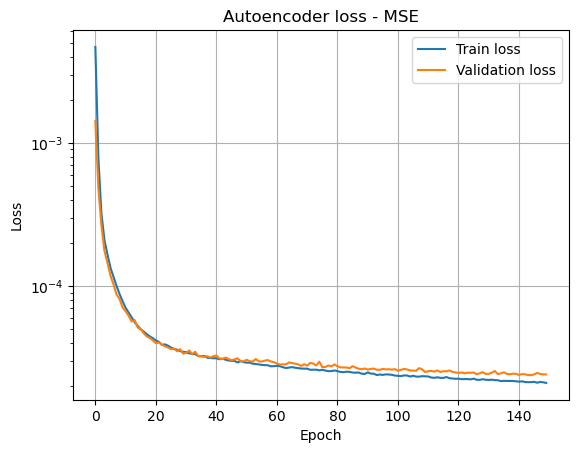

In [9]:
plot_loss(architecture, train_loss, val_loss)

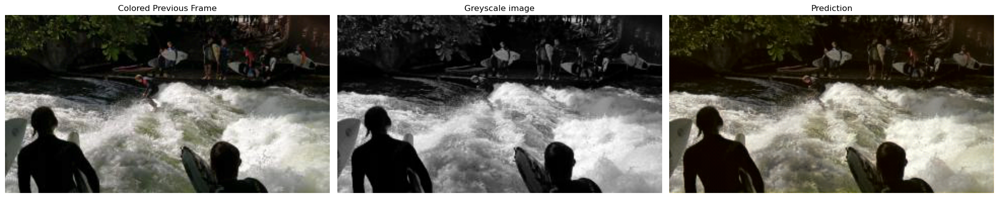

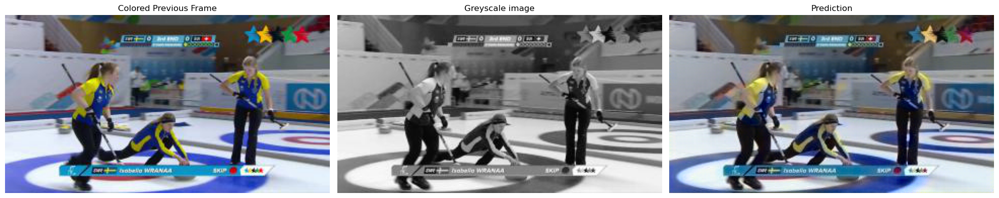

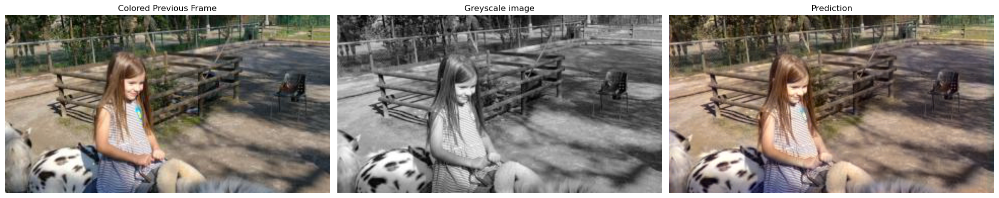

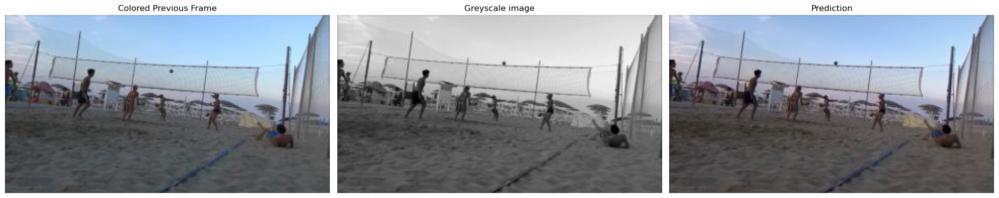

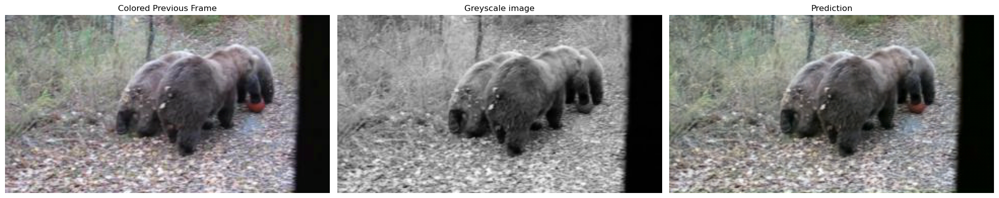

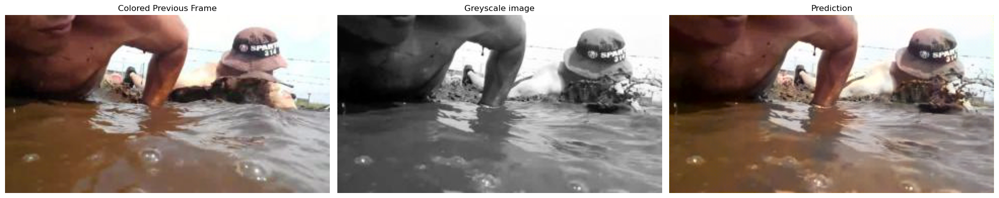

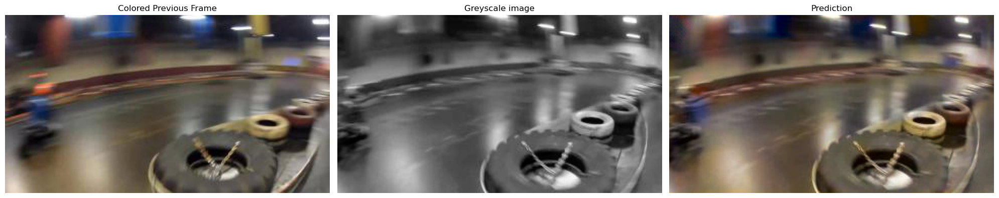

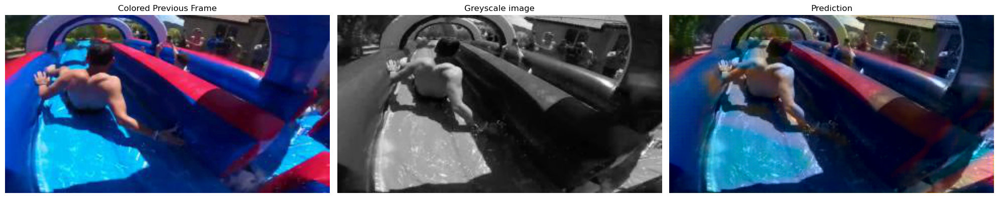

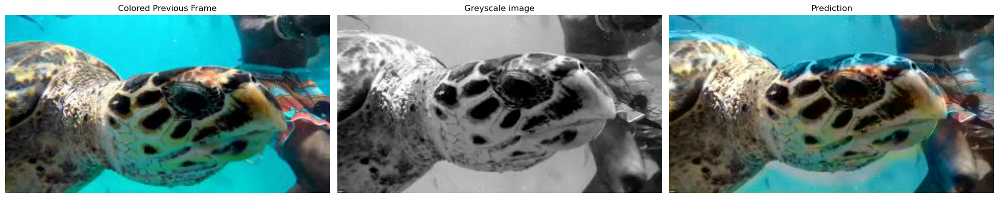

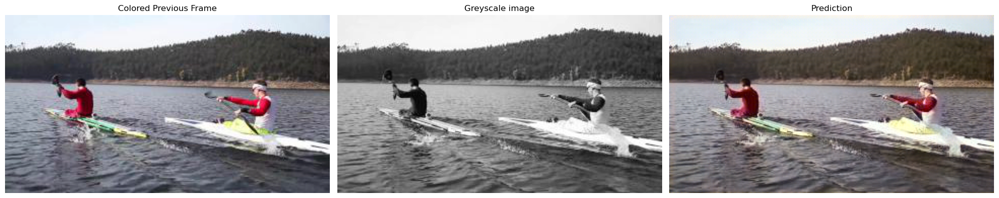

In [10]:
plot_n_predictions(test_data, model_path, architecture, method, epochs, use_flow, batch_size, num)